This is intended to be a more getting into the nitty gritty method of importing images for use with pytorch
Based on the tutorial available here:
https://medium.com/@josh_2774/deep-learning-with-pytorch-9574e74d17ad

In [71]:
# Import libraries
from PIL import Image
import numpy as np
from matplotlib.pyplot import imshow, hist

# Get one image
image_path = '/Users/zplab/Desktop/VeraPythonScripts/vera_autofocus/microscope_images/test/acceptable/16_0.png'
img = Image.open(image_path)

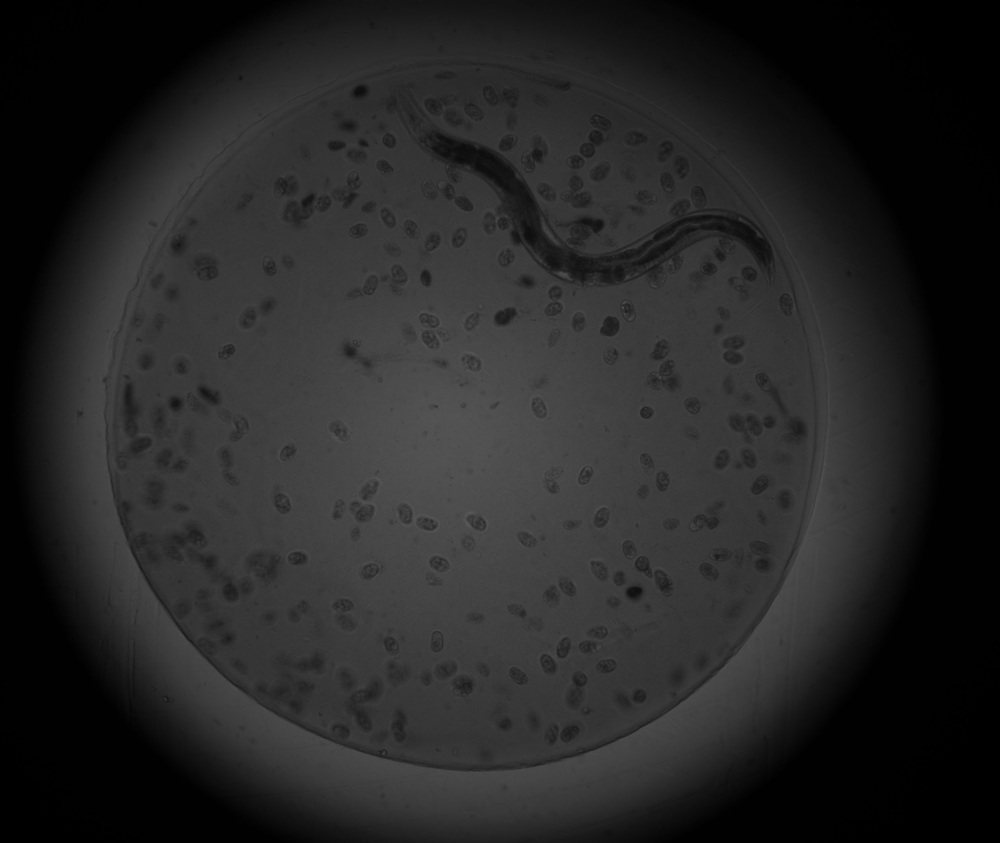

In [72]:
# Take a look at the .png image
from IPython.display import Image
Image(image_path)

In [73]:
# Re-size the image to 256 x 256
width, height = img.size
if width > height:
    img.thumbnail((256, 1000000)) # Constrain width to 256 pixels, thumbnail adjusts heigh proportionally
else:
    img.thumbnail((1000000, 256)) # Constrain height to 256 pixels

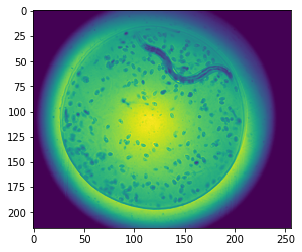

In [74]:
%matplotlib inline
imshow(np.asarray(img))

At 255 pixels, it is stil possible to clearly distinguish the worm. The next step is to drop out the center 224 pixels of the image. I'm still not 100% sure why this is done for pytorch.

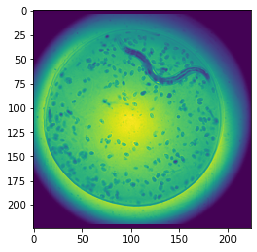

In [75]:
# Crop out center 224 by 224
left_margin = (img.width-224)/2
bottom_margin = (img.height-224)/2
right_margin = left_margin + 224
top_margin = bottom_margin + 224
img = img.crop((left_margin, bottom_margin, right_margin, top_margin))

# Visualize the result
imshow(np.asarray(img))

I was pretty concerned about doing this, but it actually does not seem to cut off the edges of the well. If a worm were up on the edge of the well this would still capture it.

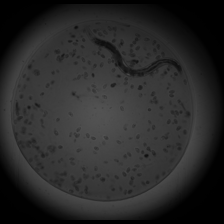

In [76]:
img

Apparently jupyter notebook will still show the black and white version as well.

In [77]:
# Convert the image into a numpy array
img = np.array(img)

In [15]:
img

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

The image is now a numpy array, with dtype = int32

In [78]:
# Get the dimensions of the array
img.shape

(224, 224)

In [79]:
# What is the max value in the array?
np.ptp(img)

21397

The array is 224 by 224, with a max value of 21397. Pytorch expects floats between 0 and 1, which are then further normalized using a mean and standard deviation from the image set the model was trained on.

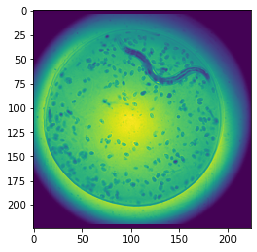

In [80]:
# Divide by the max value to get range 0 to 1
img = img / np.ptp(img)
# Visualize the result
imshow(np.asarray(img))

In [81]:
np.ptp(img)

1.0

The max value in the array is now 1. For the next step, the means and standard deviations come from a 3 color (RGB) image set. First, normalize the array with each set of mean and standard deviation, then stack the three resulting arrays together to get a single RGB array

In [82]:
Rm, Gm, Bm = [0.485, 0.456, 0.406] # provided mean
Rstd, Gstd, Bstd = [0.229, 0.224, 0.225] # provided std

# Make 3 normalized arrays from one 224 x 224 array
R = (img - Rm)/ Rstd
G = (img - Gm)/ Gstd
B = (img - Bm)/ Bstd

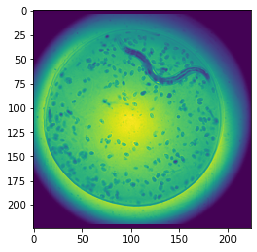

In [84]:
# View the results of normalization
# "Red"
imshow(R)

In [67]:
R

array([[-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393],
       [-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393],
       [-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393],
       ...,
       [-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393],
       [-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393],
       [-2.11790393, -2.11790393, -2.11790393, ..., -2.11790393,
        -2.11790393, -2.11790393]])

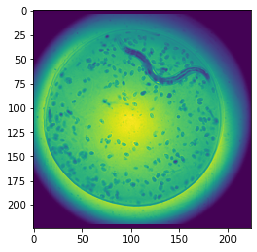

In [85]:
# View the results of normalization
# "Green"
imshow(G)

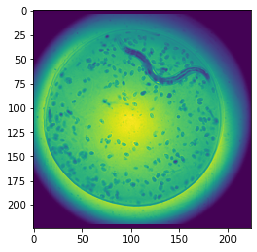

In [86]:
# View the results of normalization
# "Blue"
imshow(B)

Post normalization, the images still have good contrast and brightness. Now that we have three layers for R, G, and B, use np.stack to combine them into a single RGB array

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


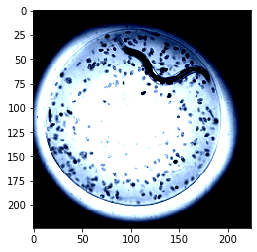

In [87]:
img_RGB = np.stack([R, G, B])
img_RGB.shape
# Visualize the result
imshow(img_RGB.transpose((1, 2, 0)))
# The dimensions are currently color height width, while matplotlib
# expects height width color. Transpose fixes this and allows the
# image to be displayed.

At this point the image is not looking too great. However, the warning displayed above in pink gives a clue that at least part of the trouble is matplotlib - it is clipping everything less than zero, so fully half the normalized values are now just black.

To check that this is just matplot lib, visualize the non-normalized stacked image

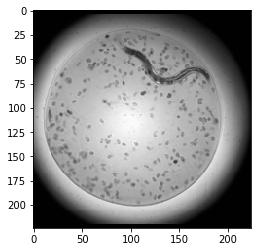

In [88]:
# Stack the arrays without normalizing
img_stack = np.stack([img, img, img])
imshow(img_stack.transpose((1, 2, 0)))

With values between 0 and 1, matplotlib displays the image correctly and we can see that it has a decent level of detail and contrast for the network to train on.

The next step is to convert the numpy array into a tensor, this is what pytorch expects.

In [89]:
import torch
tensor_RGB = torch.from_numpy(img_RGB).type(torch.FloatTensor)
tensor_RGB

tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1

In [90]:
# Check the dimensions of the tensor
tensor_RGB.size()

torch.Size([3, 224, 224])

There is one final step for this to be acceptable input to a convnet. Convnets expect sets of images, organized into batches. The batch size adds a fourth dimension. Since this is a single image there is no batch size. An easy way to fix this is to use img.unsqueeze_(0) which will add a fourth dimension of 1 to make the shape of the data acceptable to the net.

In [91]:
tensor_RGB.unsqueeze_(0)
tensor_RGB.size()

torch.Size([1, 3, 224, 224])

The above steps can be collected into a function to process the images for upload to torch.

In [ ]:
def process_image(file_path, means, stds):
    # Function loads a black and white .png image and transforms it into
    # a tensor suitable for use with pytorch
    # Inputs:
    #    file_path: string path to the image (currently complete path)
    #    norms: list of 3 means from the model original training data,
    #        corresponding to RGB
    #    stds: list of 3 standard deviations (RGB) from training data
    from PIL import Image
    import numpy as np
    import torch
    
    # Load the image
    img = Image.open(image_path)
    
    # Re-size the image to 256 x 256
    width, height = img.size
    if width > height:
        img.thumbnail((256, 1000000)) # Constrain width to 256 pixels, thumbnail adjusts heigh proportionally
    else:
        img.thumbnail((1000000, 256)) # Constrain height to 256 pixels
        
    # Crop out center 224 by 224
    left_margin = (img.width-224)/2
    bottom_margin = (img.height-224)/2
    right_margin = left_margin + 224
    top_margin = bottom_margin + 224
    img = img.crop((left_margin, bottom_margin, right_margin, top_margin))

    # Convert the image into a numpy array
    img = np.array(img)
    
    # Divide by the max value to get range 0 to 1
    img = img / np.ptp(img)
    
    Rm, Gm, Bm = means # provided mean
    Rstd, Gstd, Bstd = stds # provided std
    
    # Make 3 normalized arrays from one 224 x 224 array
    R = (img - Rm)/ Rstd
    G = (img - Gm)/ Gstd
    B = (img - Bm)/ Bstd
    
    # Stack the three normalized arrays to make an "RGB" image
    img_RGB = np.stack([R, G, B])
    
    # Convert the array into a tensor
    tensor_RGB = torch.from_numpy(img_RGB).type(torch.FloatTensor)
    
    return tensor_RGB
    

By running these steps in reverse, we can also make a function to de-process the images to check in on what the network is seeing and training on

In [ ]:
def de_process_image(tensor, means, stds):
    # Function takes a tensor corresponding to an image from pytorch and
    # converts it back into a numpy array (may add PIL image)
    # Inputs:
    #    tensor: pytorch tensor corresponding to an image
    #    norms: list of 3 means from the model original training data,
    #        corresponding to RGB
    #    stds: list of 3 standard deviations (RGB) from training data
    from PIL import Image
    import numpy as np
    import torch
    
    # Convert the tensor into a numpy array
    img_RGB = torch.Tensor.numpy(tensor)

    # Get the means and stds
    Rm, Gm, Bm = means # provided mean
    Rstd, Gstd, Bstd = stds # provided std
    
    # Take one 224 x 224 stack off the 3 x 224 x 224 "RGB" image
    img = img_RGB[1, :, :]
    
    # Breakout the means and stds. These are different for each of
    # the layers, I am making the assumption that the one I took out
    # is red. This could cause problems if the mean and std for green
    # or blue is very different.
    Rm, Gm, Bm = means # provided mean
    Rstd, Gstd, Bstd = stds # provided std
    
    # De-normalize using mean and std for red
    img = img * Rstd + Rm
    
    # At this point I am only returning the de-normalized numpy array
    # If a PIL image is desired code will need to be added to do that
    
    return img
 